# Natural Language Processing with Twitter data:
<hr/>
* [Link to the twitter scraper that extracts data](https://github.com/taspinar/twitterscraper)
* [Cleaning twitter data with NLTK](https://medium.com/@SeoJaeDuk/basic-data-cleaning-engineering-session-twitter-sentiment-data-b9376a91109b)
* [Link to the sentiment analysis tool for spanish ](https://github.com/aylliote/senti-py)
* [Plotly custom configuration for iplot](https://stackoverflow.com/questions/47230817/plotly-notebook-mode-with-google-colaboratory)
* [Comprehensive explanation of theory behind Word2Vec models](https://arxiv.org/pdf/1411.2738.pdf)

In [0]:
# import main dependencies
import numpy as np
import pandas as pd
import datetime as dt
!pip install nltk
!pip install gensim
!pip install twitterscraper
!pip install spanish_sentiment_analysis
from twitterscraper import query_tweets
import nltk
nltk.download('punkt')
from nltk import tokenize
from gensim.models import Word2Vec

# custom function to allow full functionality of plotly iplot
def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-latest.min.js?noext',
            },
          });
        </script>
        '''))

### Scrape twitter data
<hr/>

In [0]:
# scrape tweets related with a given query word
keyword = '#JEP'
scraped_data = query_tweets(keyword, begindate = dt.date(2018,12,1), limit = 2000)

In [3]:
# see example of tweet object:
obj = scraped_data[2]
print(obj.user)
print(obj.text)

xxxxxxxytr
#JEP Frente a la CPI (Corte Penal Internacional) ningún sindicado es inmune, es decir, no son válidos los fueros o blindajes presidenciales.  Si hay inoperancia de la justicia interna de un país, como en este caso, la Corte pondrá sin duda su lupa sobre las actuaciones de Uribe,


In [4]:
# build pandas DataFrame
df = None
for i, obj in enumerate(scraped_data):
  temp = pd.DataFrame({'usuario': obj.user, 'texto': obj.text, 'timestamp': obj.timestamp}, index=[i])
  df = pd.concat([df, temp])
  
df.head()

,texto,timestamp,usuario
0,#JEP Contrario a lo repetido por el senador Ur...,2018-12-05 21:52:19,xxxxxxxytr
1,#JEP El proceso ha sido vigilado y acompañado...,2018-12-05 21:41:57,xxxxxxxytr
2,#JEP Frente a la CPI (Corte Penal Internaciona...,2018-12-05 21:35:15,xxxxxxxytr
3,Getting some food prep done today! \n#cheapeat...,2018-12-05 21:03:37,JonPienkowski
4,La @JEP_Colombia #JEP brazo desarmado de las @...,2018-12-05 20:01:23,mafaldafox


### Build Word2Vec Embedding
<hr/>

In [0]:
# tokenize texts -> build embedding Word2Vec
token_list = []
for obj in scraped_data:
  token_list.append(tokenize.word_tokenize(obj.text))

model = Word2Vec(token_list, min_count = 1)

In [6]:
# example of word vector
model.wv[keyword.replace('#','')]

array([ 8.17057014e-01, -7.76855171e-01,  3.33391935e-01, -8.92538190e-01,
        5.68908572e-01,  2.45532483e-01, -6.26292825e-01,  5.69648016e-03,
        1.29066968e+00,  8.27260852e-01,  2.74770856e-01, -2.41839141e-01,
       -9.27542508e-01, -5.44691443e-01,  7.17435956e-01,  8.10689330e-01,
        1.66001260e+00, -7.74168909e-01, -3.91094118e-01, -5.23273826e-01,
        5.22701740e-01, -1.99467376e-01, -3.28459740e-01,  4.01077151e-01,
       -1.23810697e+00,  3.04471731e-01, -6.08339310e-01,  1.70354104e+00,
        1.32969275e-01, -5.20519555e-01, -3.93488646e-01,  6.20155156e-01,
        2.42785096e-01, -1.05930090e+00, -1.34050143e+00,  1.61736324e-01,
       -1.65197396e+00, -8.29316854e-01,  4.62724298e-01,  3.71562243e-01,
        2.35258415e-02, -6.67305946e-01, -5.90036251e-02, -4.51670364e-02,
        2.96319306e-01,  4.33307797e-01, -7.24987030e-01,  1.18607558e-01,
        1.14885187e+00, -6.95258915e-01, -9.83133614e-02,  1.15733528e+00,
        2.93700725e-01, -

In [7]:
# find similar words by vector distances among words in vocabulary
model.similar_by_word(keyword.replace('#',''))

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `similar_by_word` (Method will be removed in 4.0.0, use self.wv.similar_by_word() instead).
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


[('jep', 0.9998905658721924),
 ('Colombia', 0.9998480677604675),
 ('#', 0.9998446702957153),
 ('Jep', 0.9997788667678833),
 ('Santrich', 0.9997787475585938),
 ('La', 0.9997451305389404),
 ('.', 0.9997444152832031),
 ('?', 0.9997424483299255),
 ('Paz', 0.9997379779815674),
 (')', 0.999713659286499)]

### Build word dictionary with frequency countings
<hr/>

In [0]:
word_dic = {}
for token in token_list:
  for word in token:
    if word in word_dic.keys():
      word_dic[word] += 1
    else:
      word_dic[word] = 1

In [0]:
wd_df = pd.DataFrame({'word': list(word_dic.keys()), 'count': list(word_dic.values())})
wd_df = wd_df.sort_values(by = 'count', ascending=False)

In [0]:
from nltk import UnigramTagger, BigramTagger
from nltk.corpus import cess_esp as cess

### Build array of keyedVectors from corpora
<hr/>

In [0]:
vec_arr = []
for word in wd_df['word']:
  vec_arr.append(model.wv[word])

In [12]:
vec_arr[:2]

[array([ 1.12818   , -1.0650183 ,  0.4783236 , -1.203524  ,  0.7989249 ,
         0.30930555, -0.83954585, -0.03345233,  1.8181915 ,  1.1453774 ,
         0.3404846 , -0.34590504, -1.2658389 , -0.74755377,  0.9938878 ,
         1.1197306 ,  2.2799144 , -1.0693061 , -0.5411483 , -0.73218656,
         0.73401195, -0.2681737 , -0.46788296,  0.5742561 , -1.6997052 ,
         0.42527476, -0.8714017 ,  2.349815  ,  0.13585019, -0.7311108 ,
        -0.5854661 ,  0.86101794,  0.32770404, -1.4202251 , -1.7931403 ,
         0.19227499, -2.248204  , -1.1464992 ,  0.61982983,  0.5048139 ,
         0.00715506, -0.9133056 , -0.08277453, -0.06375635,  0.40813527,
         0.57887775, -0.979485  ,  0.16431443,  1.5775937 , -0.9614544 ,
        -0.13549215,  1.5874166 ,  0.38256162, -0.51959157,  0.25288337,
        -0.72795665, -0.10501426,  0.8978285 , -0.4812645 , -0.1715542 ,
         0.74541473, -1.958845  , -0.14132458, -1.1227055 , -1.2891779 ,
        -1.0671363 , -1.0572408 , -1.8839892 , -1.0

### Apply dimensionality reduction algorithm (TSNE)
<hr/>

In [0]:
from sklearn.manifold import TSNE

In [14]:
%%time
tsne = TSNE(n_components = 2, random_state = 0)
Y0 = tsne.fit_transform(vec_arr)

CPU times: user 2min 39s, sys: 526 ms, total: 2min 39s
Wall time: 2min 39s


In [0]:
x_coords = Y0[:,0]
y_coords = Y0[:,1]

In [16]:
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.offline as py
import plotly.graph_objs as go

trace = go.Scatter(x = x_coords, y = y_coords, mode = 'markers', 
                   text = list(wd_df['word'].values))

py.plot([trace], filename = 'scatter_plot.html')
configure_plotly_browser_state()
py.init_notebook_mode(connected=True)
py.iplot([trace])

In [17]:
%%time
tsne3d = TSNE(n_components = 3, random_state = 0)
Y = tsne3d.fit_transform(vec_arr)

CPU times: user 13min 41s, sys: 1.04 s, total: 13min 42s
Wall time: 13min 42s


In [18]:
trace = go.Scatter3d(x = Y[:, 0], y = Y[:, 1], z = Y[:, 2], 
                     mode = 'markers', text = list(wd_df['word'].values), 
                     marker = dict(size = 2))

py.plot([trace], filename = 'scatter3d_plot.html')
configure_plotly_browser_state()
py.init_notebook_mode(connected=True)
py.iplot([trace])

### Perform sentiment analysis
<hr/>

In [0]:
from classifier import *
clf = SentimentClassifier()

In [20]:
df['sentiment'] = df['texto'].apply(lambda x: clf.predict(x))
df.head()

,texto,timestamp,usuario,sentiment
0,#JEP Contrario a lo repetido por el senador Ur...,2018-12-05 21:52:19,xxxxxxxytr,0.058187
1,#JEP El proceso ha sido vigilado y acompañado...,2018-12-05 21:41:57,xxxxxxxytr,0.069035
2,#JEP Frente a la CPI (Corte Penal Internaciona...,2018-12-05 21:35:15,xxxxxxxytr,0.037920
3,Getting some food prep done today! \n#cheapeat...,2018-12-05 21:03:37,JonPienkowski,0.118160
4,La @JEP_Colombia #JEP brazo desarmado de las @...,2018-12-05 20:01:23,mafaldafox,0.328237


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f4349ad1198>]],
      dtype=object)

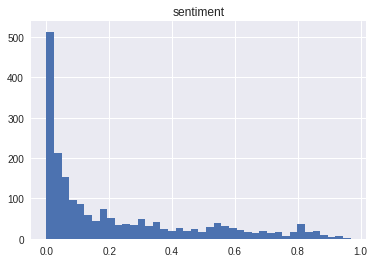

In [21]:
df.hist(column = 'sentiment', bins = 40)

In [22]:
df.sort_values(by = 'sentiment', ascending = False).head()

,texto,timestamp,usuario,sentiment
1789,"En ETCR de Charras, Guaviare, se realizó visit...",2019-02-25 12:50:04,MisionONUCol,0.968546
220,"|| Este miércoles, Yvonne Bauman, nueva embaja...",2019-01-23 21:47:55,JEP_Colombia,0.947156
1430,@FiscaliaCol @JEP_Colombia @UnidadVictimas @Co...,2019-02-13 01:32:42,jflanao,0.934566
1429,@jflanao @FiscaliaCol @JEP_Colombia @UnidadVic...,2019-02-13 01:35:26,MemoriaDDHH,0.934566
389,Fascinación y sorpresa causa en la comunidad i...,2019-01-11 06:58:36,LiliEstupinanAc,0.934459


### Sentence clustering  with KMeans
<hr/>

In [0]:
from nltk.cluster import KMeansClusterer
from sklearn import cluster
from sklearn import metrics

def sent_vectorizer(sent, model):
  sent_vec = []
  numw = 0
  for word in sent:
    try:
      if numw == 0:
        sent_vec = model.wv[word]
      else:
        sent_vec = np.add(sent_vec, model.wv[word])
      numw += 1
    except:
      pass
  return np.asarray(sent_vec)/ numw

In [24]:
sent_vectorizer(token_list[1], model)

array([ 0.42649406, -0.38818684,  0.16820098, -0.46070006,  0.30568063,
        0.13032827, -0.3410332 ,  0.00774095,  0.6654068 ,  0.41916975,
        0.15553802, -0.11005837, -0.46108457, -0.2820464 ,  0.37282264,
        0.4140298 ,  0.8597185 , -0.40932894, -0.20143427, -0.2675337 ,
        0.27631208, -0.1065262 , -0.16504747,  0.21948041, -0.6402771 ,
        0.15204081, -0.30926713,  0.89571583,  0.08607641, -0.2887869 ,
       -0.1995389 ,  0.3380531 ,  0.12462475, -0.55178905, -0.7226629 ,
        0.07606887, -0.8423816 , -0.41356203,  0.24573974,  0.18491565,
        0.01170933, -0.33484802, -0.03195176, -0.04279911,  0.15117216,
        0.23108879, -0.37025884,  0.07286852,  0.57914656, -0.37782395,
       -0.02881276,  0.59775704,  0.16476035, -0.22979222,  0.10125627,
       -0.27362475, -0.02681738,  0.3340103 , -0.17126724, -0.04927906,
        0.28757602, -0.7616112 , -0.03249513, -0.42359364, -0.47716612,
       -0.41014224, -0.39290118, -0.7126481 , -0.374006  ,  0.11

In [0]:
token_list_vec = []
for token in token_list:
  res = list(sent_vectorizer(token, model))
  if len(res) == 100: 
    token_list_vec.append(res)

In [26]:
NUM_CLUSTERS = 3
kmeans = cluster.KMeans(n_clusters = NUM_CLUSTERS)
kmeans.fit(token_list_vec)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=3, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

In [0]:
labels = kmeans.labels_
centroids = kmeans.cluster_centers_

In [0]:
km_tsne = TSNE(n_components=2, random_state = 0)
np.set_printoptions(suppress = True)

kmY = km_tsne.fit_transform(token_list_vec)

In [29]:
df['tsne_x_coord'] = kmY[:, 0]
df['tsne_y_coord'] = kmY[:, 1]
df['cluster_label'] = labels
df.head()

,texto,timestamp,usuario,sentiment,tsne_x_coord,tsne_y_coord,cluster_label
0,#JEP Contrario a lo repetido por el senador Ur...,2018-12-05 21:52:19,xxxxxxxytr,0.058187,-21.749090,-13.604741,0
1,#JEP El proceso ha sido vigilado y acompañado...,2018-12-05 21:41:57,xxxxxxxytr,0.069035,-30.950968,-34.135193,1
2,#JEP Frente a la CPI (Corte Penal Internaciona...,2018-12-05 21:35:15,xxxxxxxytr,0.037920,29.653585,35.590134,2
3,Getting some food prep done today! \n#cheapeat...,2018-12-05 21:03:37,JonPienkowski,0.118160,15.598109,33.344181,2
4,La @JEP_Colombia #JEP brazo desarmado de las @...,2018-12-05 20:01:23,mafaldafox,0.328237,-6.122708,-19.277052,0


In [30]:
trace_c1 = go.Scatter(x = [], y = [], mode = 'markers', text = [], 
                      marker = dict(color = 'red'))
trace_c2 = go.Scatter(x = [], y = [], mode = 'markers', text = [], 
                      marker = dict(color = 'blue'))
trace_c3 = go.Scatter(x = [], y = [], mode = 'markers', text = [], 
                      marker = dict(color = 'green'))
trace_c4 = go.Scatter(x = [], y = [], mode = 'markers', text = [], 
                      marker = dict(color = 'yellow'))

for i in range(len(df)):
  if df.iloc[i]['cluster_label'] == 0:
    trace_c1.x = list(trace_c1.x) + [df.iloc[i]['tsne_x_coord']]
    trace_c1.y = list(trace_c1.y) + [df.iloc[i]['tsne_y_coord']]
    trace_c1.text = list(trace_c1.text) + [df.iloc[i]['texto']]
  if df.iloc[i]['cluster_label'] == 1:
    trace_c2.x = list(trace_c2.x) + [df.iloc[i]['tsne_x_coord']]
    trace_c2.y = list(trace_c2.y) + [df.iloc[i]['tsne_y_coord']]
    trace_c2.text = list(trace_c2.text) + [df.iloc[i]['texto']]
  if df.iloc[i]['cluster_label'] == 2:
    trace_c3.x = list(trace_c3.x) + [df.iloc[i]['tsne_x_coord']]
    trace_c3.y = list(trace_c3.y) + [df.iloc[i]['tsne_y_coord']]
    trace_c3.text = list(trace_c3.text) + [df.iloc[i]['texto']]
  if df.iloc[i]['cluster_label'] == 3:
    trace_c4.x = list(trace_c4.x) + [df.iloc[i]['tsne_x_coord']]
    trace_c4.y = list(trace_c4.y) + [df.iloc[i]['tsne_y_coord']]
    trace_c4.text = list(trace_c4.text) + [df.iloc[i]['texto']]


#py.plot([trace], filename = 'scatter_plot.html')
configure_plotly_browser_state()
py.init_notebook_mode(connected=True)
py.iplot([trace_c1, trace_c2, trace_c3, trace_c4])

In [31]:
trace_c1 = go.Scatter3d(x = [], y = [], z = [], mode = 'markers', text = [], 
                        marker = dict(color = 'red', size = 2))
trace_c2 = go.Scatter3d(x = [], y = [], z = [], mode = 'markers', text = [], 
                        marker = dict(color = 'blue', size = 2))
trace_c3 = go.Scatter3d(x = [], y = [], z = [],mode = 'markers', text = [], 
                        marker = dict(color = 'green', size = 2))
trace_c4 = go.Scatter3d(x = [], y = [], z = [],mode = 'markers', text = [], 
                        marker = dict(color = 'yellow', size = 2))

for i in range(len(df)):
  if df.iloc[i]['cluster_label'] == 0:
    trace_c1.x = list(trace_c1.x) + [df.iloc[i]['tsne_x_coord']]
    trace_c1.y = list(trace_c1.y) + [df.iloc[i]['tsne_y_coord']]
    trace_c1.z = list(trace_c1.z) + [df.iloc[i]['sentiment']]
    trace_c1.text = list(trace_c1.text) + [df.iloc[i]['texto']]
  if df.iloc[i]['cluster_label'] == 1:
    trace_c2.x = list(trace_c2.x) + [df.iloc[i]['tsne_x_coord']]
    trace_c2.y = list(trace_c2.y) + [df.iloc[i]['tsne_y_coord']]
    trace_c2.z = list(trace_c2.z) + [df.iloc[i]['sentiment']]
    trace_c2.text = list(trace_c2.text) + [df.iloc[i]['texto']]
  if df.iloc[i]['cluster_label'] == 2:
    trace_c3.x = list(trace_c3.x) + [df.iloc[i]['tsne_x_coord']]
    trace_c3.y = list(trace_c3.y) + [df.iloc[i]['tsne_y_coord']]
    trace_c3.z = list(trace_c3.z) + [df.iloc[i]['sentiment']]
    trace_c3.text = list(trace_c3.text) + [df.iloc[i]['texto']]
  if df.iloc[i]['cluster_label'] == 3:
    trace_c4.x = list(trace_c4.x) + [df.iloc[i]['tsne_x_coord']]
    trace_c4.y = list(trace_c4.y) + [df.iloc[i]['tsne_y_coord']]
    trace_c4.z = list(trace_c4.z) + [df.iloc[i]['sentiment']]
    trace_c4.text = list(trace_c4.text) + [df.iloc[i]['texto']]


#py.plot([trace], filename = 'scatter_plot.html')
configure_plotly_browser_state()
py.init_notebook_mode(connected=True)
py.iplot([trace_c1, trace_c2, trace_c3, trace_c4])

### Applying Elbow method to determine optimal number of clusters

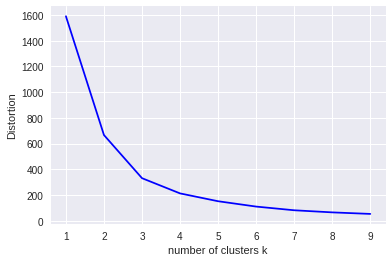

In [32]:
from scipy.spatial.distance import cdist
distortions = []
K = range(1,10)
for k in K:
  kmeanModel = cluster.KMeans(n_clusters = k)
  kmeanModel.fit(token_list_vec)
  distortions.append(kmeanModel.inertia_)

plt.plot(K, distortions, 'bx-')
plt.xlabel('number of clusters k')
plt.ylabel('Distortion')
plt.show()